### Test of pretrained Monet2Photo CycleGAN

The setup included several steps that were mostly done in the terminal:

1. Clone the repository and move into directory:

    ```bash
    git clone https://github.com/junyanz/pytorch-CycleGAN-and-pix2pix
    cd pytorch-CycleGAN-and-pix2pix
    ```
    
2. Install required libraries:

    ```powershell
    pip install torch torchvision torchaudio
    pip install dominate visdom wandb
    ```

3. Download pretrained model through the web as the suggested download was not working for powershell:

    ```powershell
    New-Item -ItemType Directory -Force -Path "checkpoints\monet2photo_pretrained"
    Invoke-WebRequest -Uri "http://efrosgans.eecs.berkeley.edu/cyclegan/pretrained_models/monet2photo.pth" -OutFile "checkpoints\monet2photo_pretrained\latest_net_G.pth"
    ```

4. Download datasets:

    ```powershell
    Invoke-WebRequest -Uri "http://efrosgans.eecs.berkeley.edu/cyclegan/datasets/monet2photo.zip" -OutFile "datasets\monet2photo.zip"
    python -c "import zipfile; zipfile.ZipFile('datasets/monet2photo.zip').extractall('datasets/')"
    Remove-Item "datasets\monet2photo.zip"
    ```
    ```powershell
    Invoke-WebRequest -Uri "http://efrosgans.eecs.berkeley.edu/cyclegan/datasets/cezanne2photo.zip" -OutFile "datasets\cezanne2photo.zip"
    python -c "import zipfile; zipfile.ZipFile('datasets/cezanne2photo.zip').extractall('datasets/')"
    Remove-Item "datasets\cezanne2photo.zip"
    ```

5. Test on both artists:

    ```powershell
    python test.py --dataroot datasets/monet2photo/testA --name monet2photo_pretrained --model test --no_dropout --num_test 50 --phase test_monet
    ```
    Results saved to: `results/monet2photo_pretrained/test_monet_latest/`

    ```powershell
    python test.py --dataroot datasets/cezanne2photo/testA --name monet2photo_pretrained --model test --no_dropout --num_test 50 --phase test_cezanne
    ```
    Results saved to: `results/monet2photo_pretrained/test_cezanne_latest/`

To test everything on drawings from Van Gogh, an additional dataset from Kagglehub has to be downloaded.

In [ ]:
# Downnload Van Gogh dataset from Kaggle

import kagglehub
path = kagglehub.dataset_download("ipythonx/van-gogh-paintings")

print("Path to dataset files:", path)

Path to dataset files: C:\Users\Yoshio\.cache\kagglehub\datasets\ipythonx\van-gogh-paintings\versions\2


In [ ]:
# Import libraries to move five images out of each Van Gogh subfolder into test A folder
import os
import shutil
import random

# Create folder vangogh2photo/testA if it doesn't exist
os.makedirs("pytorch-CycleGAN-and-pix2pix/datasets/vangogh2photo/testA", exist_ok=True)

# Find dataset source directory
source_directory = path + "\VincentVanGogh"

# Loop through each subfolder and select five images to move into test A folder        
for subfolder in os.listdir(source_directory):
    subfolder_path = os.path.join(source_directory, subfolder)
    if os.path.isdir(subfolder_path):
        images = sorted([f for f in os.listdir(subfolder_path) if f.lower().endswith('.jpg')])
        selected_images = images[:5]  # Take first 5 iamges
        for image in selected_images:
            src_path = os.path.join(subfolder_path, image)
            dst_path = os.path.join("pytorch-CycleGAN-and-pix2pix/datasets/vangogh2photo/testA", image)
            shutil.copy(src_path, dst_path)

<>:11: SyntaxWarning: "\V" is an invalid escape sequence. Such sequences will not work in the future. Did you mean "\\V"? A raw string is also an option.
<>:11: SyntaxWarning: "\V" is an invalid escape sequence. Such sequences will not work in the future. Did you mean "\\V"? A raw string is also an option.
C:\Users\Yoshio\AppData\Local\Temp\ipykernel_14604\2533347785.py:11: SyntaxWarning: "\V" is an invalid escape sequence. Such sequences will not work in the future. Did you mean "\\V"? A raw string is also an option.
  source_directory = path + "\VincentVanGogh"


To test, the following command was run:

```powershell
python test.py --dataroot datasets/vangogh2photo/testA --name monet2photo_pretrained --model test --no_dropout --num_test 50 --phase test_van_gogh
```


The results show what we suspected: The model can create somewhat realistic images of the Monet paintings but struggles with Cezanne and Van Gogh. Below are some examples results.

In [2]:
import matplotlib.pyplot as plt
from PIL import Image

def compare_single_pair(real_path, fake_path, figsize=(12, 6)):
    """ Display one pair of real and fake images side-by-side """
    
    fig, axes = plt.subplots(1, 2, figsize=figsize)
    
    # Load images
    real_img = Image.open(real_path)
    fake_img = Image.open(fake_path)
    
    # Display images
    axes[0].imshow(real_img)
    axes[0].set_title('Original')
    axes[0].axis('off')
    
    axes[1].imshow(fake_img)
    axes[1].set_title('Generated')
    axes[1].axis('off')
    
    plt.tight_layout()
    plt.show()

Monet2Photo:

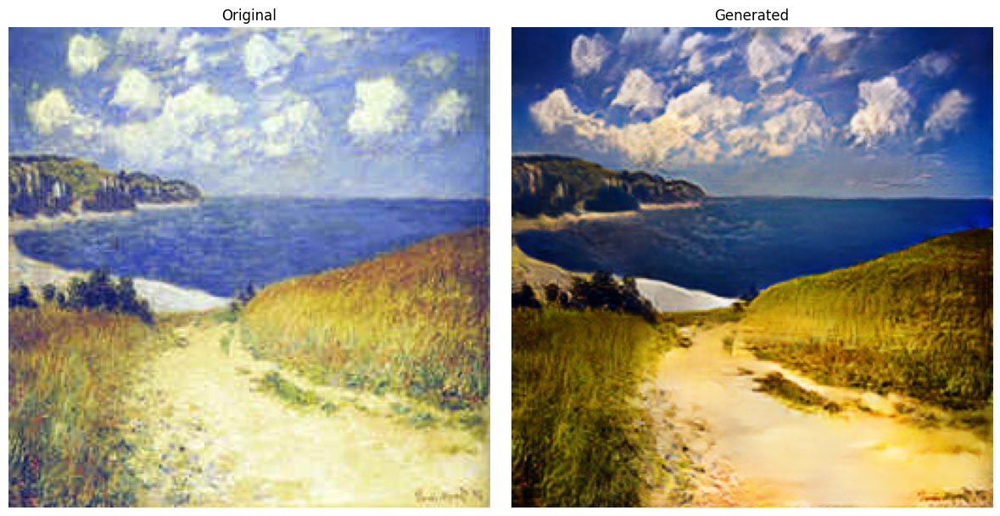

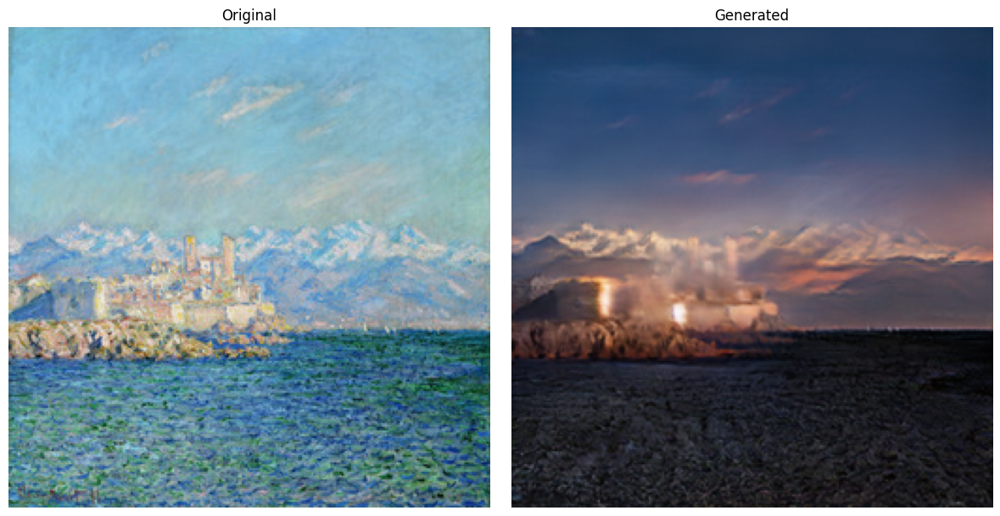

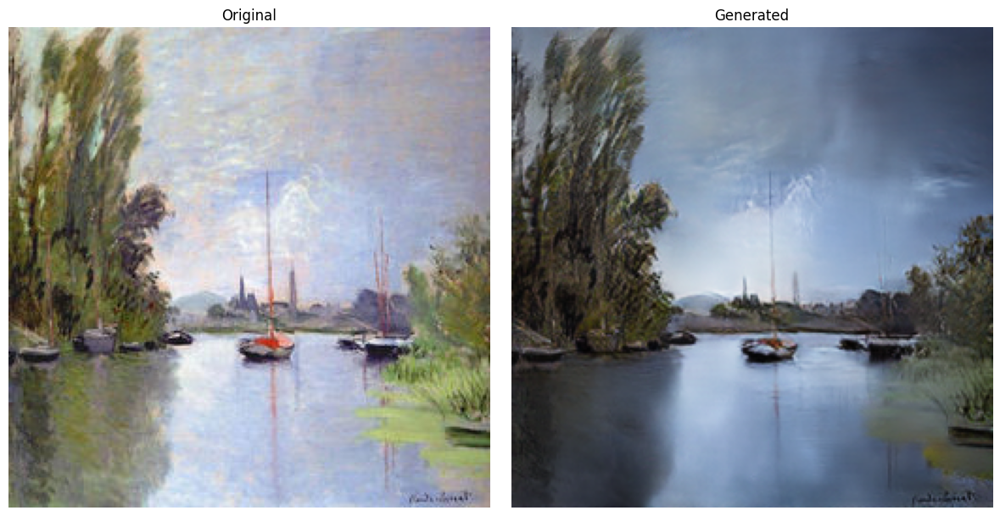

In [15]:
compare_single_pair("pytorch-CycleGAN-and-pix2pix/results/monet2photo_pretrained/test_monet_latest/images/00010_real.png",
                    "pytorch-CycleGAN-and-pix2pix/results/monet2photo_pretrained/test_monet_latest/images/00010_fake.png")

compare_single_pair("pytorch-CycleGAN-and-pix2pix/results/monet2photo_pretrained/test_monet_latest/images/00020_real.png",
                    "pytorch-CycleGAN-and-pix2pix/results/monet2photo_pretrained/test_monet_latest/images/00020_fake.png")

compare_single_pair("pytorch-CycleGAN-and-pix2pix/results/monet2photo_pretrained/test_monet_latest/images/00030_real.png",
                    "pytorch-CycleGAN-and-pix2pix/results/monet2photo_pretrained/test_monet_latest/images/00030_fake.png")

Cezanne2Photo:

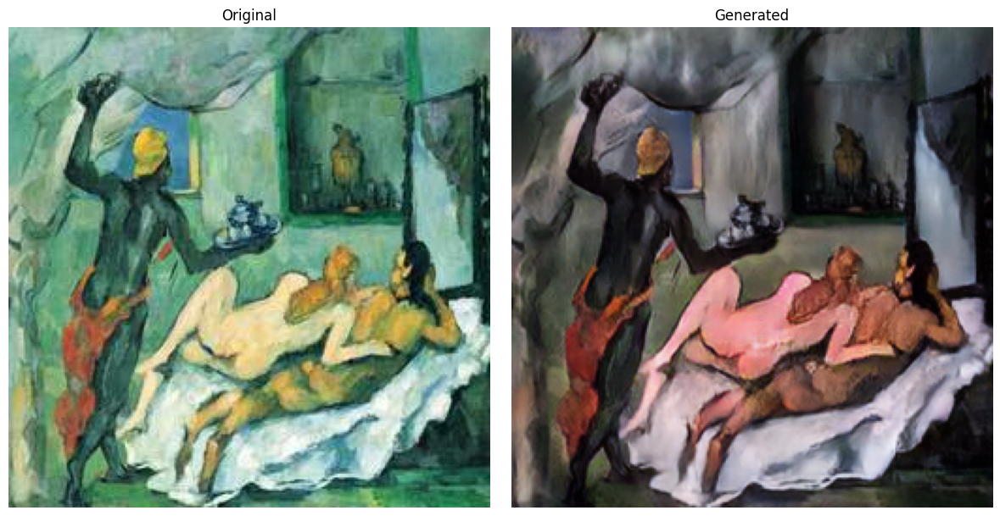

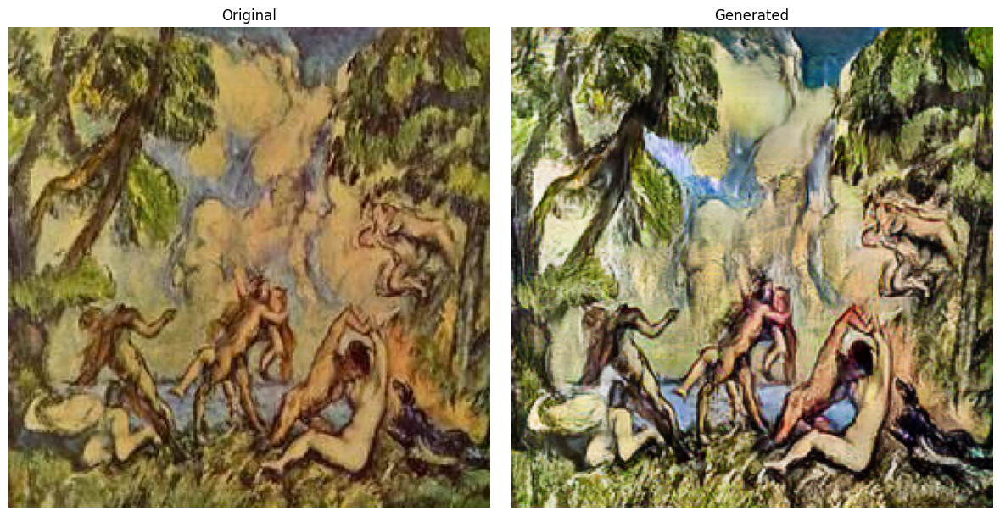

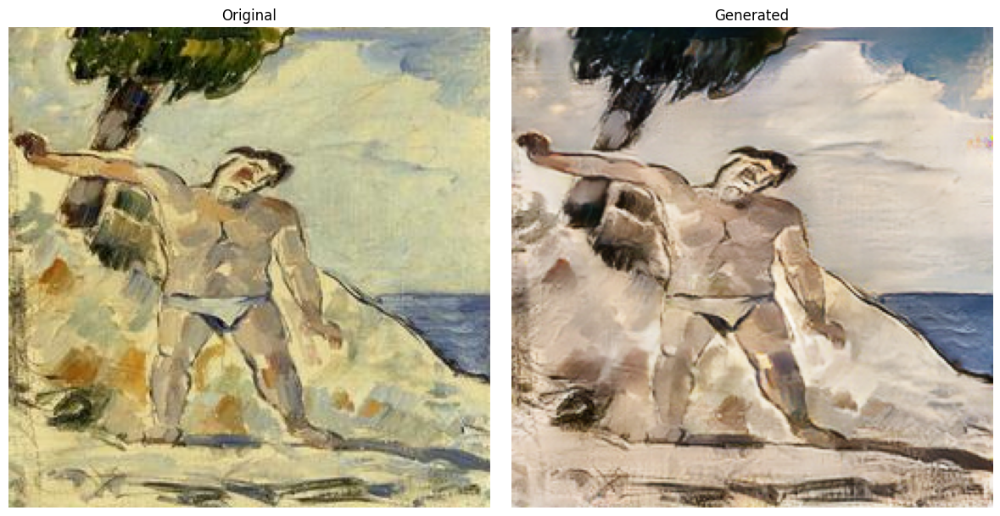

In [16]:
compare_single_pair("pytorch-CycleGAN-and-pix2pix/results/monet2photo_pretrained/test_cezanne_latest/images/00010_real.png",
                    "pytorch-CycleGAN-and-pix2pix/results/monet2photo_pretrained/test_cezanne_latest/images/00010_fake.png")

compare_single_pair("pytorch-CycleGAN-and-pix2pix/results/monet2photo_pretrained/test_cezanne_latest/images/00020_real.png",
                    "pytorch-CycleGAN-and-pix2pix/results/monet2photo_pretrained/test_cezanne_latest/images/00020_fake.png")

compare_single_pair("pytorch-CycleGAN-and-pix2pix/results/monet2photo_pretrained/test_cezanne_latest/images/00060_real.png",
                    "pytorch-CycleGAN-and-pix2pix/results/monet2photo_pretrained/test_cezanne_latest/images/00060_fake.png")

VanGogh2Photo:

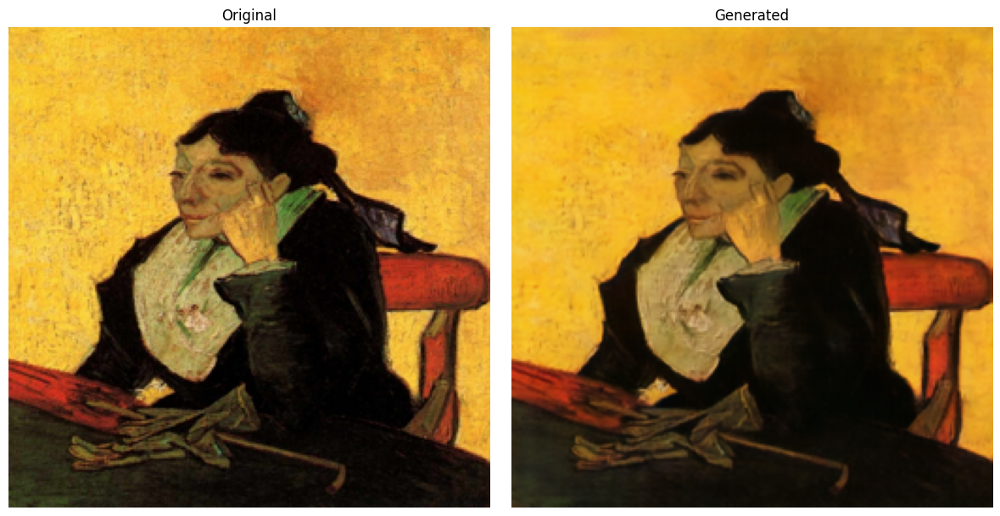

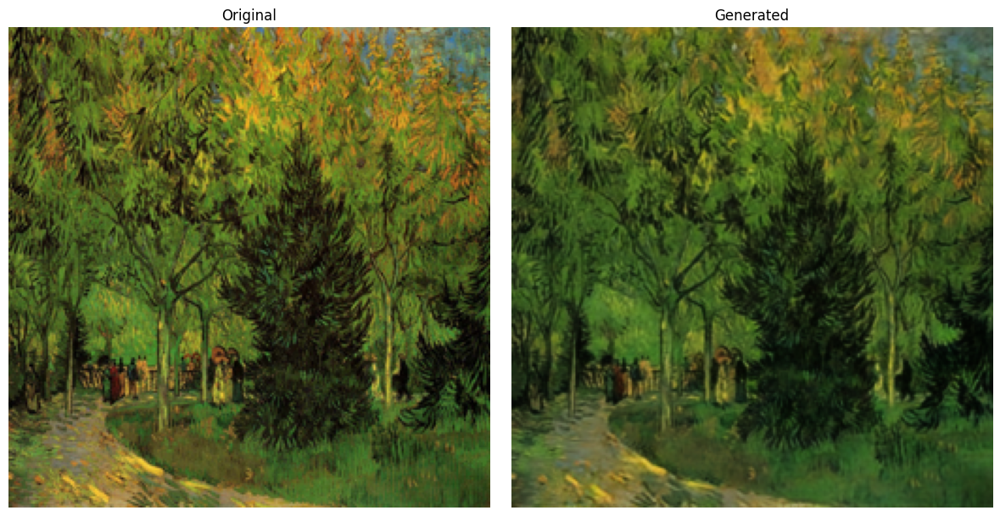

In [17]:
compare_single_pair("pytorch-CycleGAN-and-pix2pix/results/monet2photo_pretrained/test_van_gogh_latest/images/A L Arlesienne Madame Ginoux with Gloves and Umbre_real.png",
                    "pytorch-CycleGAN-and-pix2pix/results/monet2photo_pretrained/test_van_gogh_latest/images/A L Arlesienne Madame Ginoux with Gloves and Umbre_fake.png")

compare_single_pair("pytorch-CycleGAN-and-pix2pix/results/monet2photo_pretrained/test_van_gogh_latest/images/A Lane in the Public Garden at Arles_real.png",
                    "pytorch-CycleGAN-and-pix2pix/results/monet2photo_pretrained/test_van_gogh_latest/images/A Lane in the Public Garden at Arles_fake.png")